# Install libraries

In [1]:
!pip install -q lightning

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 800.9/800.9 kB 27.5 MB/s eta 0:00:00


# Collect data

In [2]:
#download dataset
!gdown 197JiJUIXbXpZylimFqtBz9DeA_dn2BLa
!unzip /content/data_17K.zip

Streaming output truncated to the last 5000 lines.
  inflating: data/train/pure/dc354_silkcut_002_bottom_212.png  
  inflating: data/train/pure/dc354_discolored_000_bottom_062.png  
  inflating: data/train/pure/dc354_broken_004_bottom_228.png  
  inflating: data/train/pure/new_dc317_discolored_002_top_284.png  
  inflating: data/train/pure/new_dc317_discolored_002_bottom_036.png  
  inflating: data/train/pure/dc354_discolored_000_bottom_276.png  
  inflating: data/train/pure/new_dc354_broken_001_top_220.png  
  inflating: data/train/pure/new_dc317_silkcut_001_top_180.png  
  inflating: data/train/pure/new_dc317_discolored_001_bottom_142.png  
  inflating: data/train/pure/new_dc317_silkcut_000_top_216.png  
  inflating: data/train/pure/dc354_discolored_004_bottom_091.png  
  inflating: data/train/pure/new_dc354_broken_001_top_255.png  
  inflating: data/train/pure/dc354_discolored_006_top_137.png  
  inflating: data/train/pure/dc354_discolored_003_bottom_059.png  
  inflating: data/trai

# Training ResNet 50

In [3]:
# import libraries
import torch
import lightning as L
from lightning.pytorch.callbacks import (ModelCheckpoint, EarlyStopping)
import torchmetrics
import torchvision
from sklearn.model_selection import train_test_split
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

In [4]:
train_path = '/content/data/train'
val_path = '/content/data/validation'
list_ = [name for name in os.listdir(train_path)]
list_

['discolored', 'silkcut', 'pure', 'broken']

In [5]:
NAME2NUMBER = {}
for index, label in enumerate(list_):
  NAME2NUMBER[label] = index

def get_path(path):
  paths = []
  for name in list_:
    l = glob.glob(f"{path}/{name}/*.png")
    print(l)
    for i in l:
      paths.append({"name": name,
                    "path": i,
                    "label": NAME2NUMBER[name]})
  return paths

train_paths = get_path(train_path)
val_paths = get_path(val_path)

['/content/data/train/discolored/new_dc317_broken_000_bottom_213.png', '/content/data/train/discolored/new_dc354_broken_000_bottom_066.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_027.png', '/content/data/train/discolored/dc354_discolored_000_bottom_144.png', '/content/data/train/discolored/new_dc317_broken_002_top_109.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_029.png', '/content/data/train/discolored/dc354_broken_003_top_101.png', '/content/data/train/discolored/dc354_discolored_005_bottom_158.png', '/content/data/train/discolored/new_dc317_broken_001_top_211.png', '/content/data/train/discolored/new_dc354_broken_001_top_184.png', '/content/data/train/discolored/dc354_broken_004_bottom_103.png', '/content/data/train/discolored/new_dc354_discolored_002_top_079.png', '/content/data/train/discolored/dc354_discolored_005_top_150.png', '/content/data/train/discolored/dc354_broken_002_bottom_202.png', '/content/data/train/discolored/new_dc317_broken_

In [6]:
class DataSet(torch.utils.data.Dataset):

    def __init__(self, features, new_size = (224, 224)):
        super(DataSet, self).__init__()
        self.features = features
        self.resize_transform = torchvision.transforms.Resize(new_size)

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        paths = self.features[idx]['path']
        image = torchvision.io.read_image(paths) / 255.0
        image = self.resize_transform(image)
        label = torch.tensor(self.features[idx]['label'])
        return {
            'image': image,
            'label': label
        }

Data = DataSet(val_paths)

In [7]:
class DataModule(L.LightningDataModule):

    def __init__(self, batch_size, num_workers, train_path, val_path):
        super(DataModule, self).__init__()
        self.train_path = train_path
        self.val_path = val_path
        self.batch_size = batch_size  # batch size
        self.num_workers = num_workers  # number of workers

    def setup(self, stage=None):
        train_paths = get_path(self.train_path)
        val_paths = get_path(self.val_path)
        train_paths, test_paths =  train_test_split(train_paths,
                                                    test_size=0.2,
                                                    random_state=0)

        self.train_dataset = DataSet(train_paths)
        self.val_dataset = DataSet(val_paths)
        self.test_dataset = DataSet(test_paths)

    def train_dataloader(self):
       return torch.utils.data.DataLoader(self.train_dataset, shuffle=True,
                                          batch_size=self.batch_size,
                                          num_workers=self.num_workers)

    def val_dataloader(self):
        return torch.utils.data.DataLoader(self.val_dataset, shuffle=False,
                                           batch_size=self.batch_size,
                                           num_workers=self.num_workers)

    def test_dataloader(self):
        return torch.utils.data.DataLoader(self.test_dataset, shuffle=False,
                                           batch_size=self.batch_size,
                                           num_workers=self.num_workers)


data_module = DataModule(batch_size=32, num_workers=2,
                         train_path=train_path, val_path=val_path)
data_module.setup()
test_loader = data_module.test_dataloader()
next(iter(test_loader))

['/content/data/train/discolored/new_dc317_broken_000_bottom_213.png', '/content/data/train/discolored/new_dc354_broken_000_bottom_066.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_027.png', '/content/data/train/discolored/dc354_discolored_000_bottom_144.png', '/content/data/train/discolored/new_dc317_broken_002_top_109.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_029.png', '/content/data/train/discolored/dc354_broken_003_top_101.png', '/content/data/train/discolored/dc354_discolored_005_bottom_158.png', '/content/data/train/discolored/new_dc317_broken_001_top_211.png', '/content/data/train/discolored/new_dc354_broken_001_top_184.png', '/content/data/train/discolored/dc354_broken_004_bottom_103.png', '/content/data/train/discolored/new_dc354_discolored_002_top_079.png', '/content/data/train/discolored/dc354_discolored_005_top_150.png', '/content/data/train/discolored/dc354_broken_002_bottom_202.png', '/content/data/train/discolored/new_dc317_broken_

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

{'image': tensor([[[[0.6863, 0.6831, 0.6786,  ..., 0.7217, 0.7216, 0.7216],
           [0.6863, 0.6839, 0.6807,  ..., 0.7238, 0.7237, 0.7237],
           [0.6853, 0.6849, 0.6844,  ..., 0.7255, 0.7255, 0.7255],
           ...,
           [0.7107, 0.7104, 0.7099,  ..., 0.7530, 0.7553, 0.7569],
           [0.7116, 0.7116, 0.7117,  ..., 0.7548, 0.7560, 0.7569],
           [0.7137, 0.7137, 0.7138,  ..., 0.7569, 0.7569, 0.7569]],
 
          [[0.7255, 0.7255, 0.7256,  ..., 0.7569, 0.7615, 0.7647],
           [0.7276, 0.7267, 0.7256,  ..., 0.7589, 0.7636, 0.7668],
           [0.7294, 0.7282, 0.7265,  ..., 0.7607, 0.7648, 0.7677],
           ...,
           [0.7657, 0.7653, 0.7648,  ..., 0.7883, 0.7905, 0.7922],
           [0.7665, 0.7665, 0.7666,  ..., 0.7901, 0.7913, 0.7922],
           [0.7686, 0.7686, 0.7686,  ..., 0.7922, 0.7922, 0.7922]],
 
          [[0.6902, 0.6902, 0.6902,  ..., 0.7176, 0.7200, 0.7216],
           [0.6923, 0.6915, 0.6902,  ..., 0.7197, 0.7221, 0.7237],
           [0.6

In [8]:
class Model(L.LightningModule):
  def __init__(self, is_train=False, learning_rate=1e-3, num_target_classes=4,
               backbone=torchvision.models.resnet50(weights="DEFAULT")):
    super(Model, self).__init__()
    backbone = backbone
    num_filters = backbone.fc.in_features
    layers = list(backbone.children())[:-1]

    self.feature_extractor = torch.nn.Sequential(*layers)
    self.classifier = torch.nn.Linear(num_filters, num_target_classes)
    self.is_train = is_train
    self.learning_rate = learning_rate
    self.loss = torch.nn.CrossEntropyLoss()
    self.accuracy = torchmetrics.classification.Accuracy(task="multiclass", num_classes=num_target_classes)

  def forward(self, x):
    self.feature_extractor.eval()
    if self.is_train:
      representations = self.feature_extractor(x).flatten(1)
    else:
      with torch.no_grad():
        representations = self.feature_extractor(x).flatten(1)
    x = self.classifier(representations)
    return x

  def training_step(self, batch, batch_idx):
    x = batch["image"]
    y = batch["label"]
    y_pred = self(x)
    loss = self.loss(y_pred, y)
    acc = self.accuracy(y_pred, y)
    self.log_dict({'train_loss': loss, 'train_acc': acc} , prog_bar=True)
    return loss

  def validation_step(self, batch, batch_idx):
    x = batch["image"]
    y = batch["label"]
    y_pred = self(x)
    val_loss = self.loss(y_pred, y)
    val_acc = self.accuracy(y_pred, y)
    self.log_dict({'val_loss': val_loss, 'val_acc': val_acc}, prog_bar=True)
    return val_loss

  def test_step(self, batch, batch_idx):
    x = batch["image"]
    y = batch["label"]
    y_pred = self(x)
    test_loss = self.loss(y_pred, y)
    test_acc = self.accuracy(y_pred, y)
    self.log_dict({'test_loss': test_loss, 'test_acc': test_acc}, prog_bar=True)
    return test_loss

  def predict_step(self, batch, batch_idx, dataloader_idx=None):
    x = batch["image"]
    y_pred = self(x)
    y_pred_prob = torch.nn.functional.softmax(y_pred, dim=-1)
    y_pred_real = torch.argmax(y_pred_prob, dim=-1)
    return y_pred_real, y_pred_prob.max(dim=-1).values


  def configure_optimizers(self):
    optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)  #
    return optimizer

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:02<00:00, 36.8MB/s]


In [9]:
model_checkpoint = ModelCheckpoint(dirpath = 'checkpoint/',
                                   monitor='val_acc',
                                   verbose=True,
                                   mode='max',
                                   save_top_k=1)

early_stopping = EarlyStopping(monitor="val_acc", mode='max',
                               min_delta=1e-4, patience=5)

callbacks = [model_checkpoint, early_stopping]

model = Model()

data_module = DataModule(
    batch_size=512,
    num_workers=1,
    train_path=train_path,
    val_path=val_path
)
trainer = L.Trainer(
    max_epochs=10,
    detect_anomaly=True,
    callbacks=callbacks,
)

INFO: You have turned on `Trainer(detect_anomaly=True)`. This will significantly slow down compute speed and is recommended only for model debugging.
INFO:lightning.pytorch.utilities.rank_zero:You have turned on `Trainer(detect_anomaly=True)`. This will significantly slow down compute speed and is recommended only for model debugging.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [10]:
trainer.fit(model, data_module)

['/content/data/train/discolored/new_dc317_broken_000_bottom_213.png', '/content/data/train/discolored/new_dc354_broken_000_bottom_066.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_027.png', '/content/data/train/discolored/dc354_discolored_000_bottom_144.png', '/content/data/train/discolored/new_dc317_broken_002_top_109.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_029.png', '/content/data/train/discolored/dc354_broken_003_top_101.png', '/content/data/train/discolored/dc354_discolored_005_bottom_158.png', '/content/data/train/discolored/new_dc317_broken_001_top_211.png', '/content/data/train/discolored/new_dc354_broken_001_top_184.png', '/content/data/train/discolored/dc354_broken_004_bottom_103.png', '/content/data/train/discolored/new_dc354_discolored_002_top_079.png', '/content/data/train/discolored/dc354_discolored_005_top_150.png', '/content/data/train/discolored/dc354_broken_002_bottom_202.png', '/content/data/train/discolored/new_dc317_broken_

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name              | Type               | Params
---------------------------------------------------------
0 | feature_extractor | Sequential         | 23.5 M
1 | classifier        | Linear             | 8.2 K 
2 | loss              | CrossEntropyLoss   | 0     
3 | accuracy          | MulticlassAccuracy | 0     
---------------------------------------------------------
23.5 M    Trainable params
0         Non-trainable params
23.5 M    Total params
94.065    Total estimated model params size (MB)
INFO:lightning.pytorch.callbacks.model_summary:
  | Name              | Type               | Params
---------------------------------------------------------
0 | feature_extractor | Sequential         | 23.5 M
1 | classifier        | Linear             | 8.2 K 
2 | loss              | CrossEntropyLoss   | 0     
3 | accuracy          | MulticlassAccuracy

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (23) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 23: 'val_acc' reached 0.57402 (best 0.57402), saving model to '/content/checkpoint/epoch=0-step=23.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 23: 'val_acc' reached 0.57402 (best 0.57402), saving model to '/content/checkpoint/epoch=0-step=23.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 46: 'val_acc' reached 0.62892 (best 0.62892), saving model to '/content/checkpoint/epoch=1-step=46.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 46: 'val_acc' reached 0.62892 (best 0.62892), saving model to '/content/checkpoint/epoch=1-step=46.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 69: 'val_acc' reached 0.65220 (best 0.65220), saving model to '/content/checkpoint/epoch=2-step=69.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 69: 'val_acc' reached 0.65220 (best 0.65220), saving model to '/content/checkpoint/epoch=2-step=69.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 92: 'val_acc' reached 0.66887 (best 0.66887), saving model to '/content/checkpoint/epoch=3-step=92.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 92: 'val_acc' reached 0.66887 (best 0.66887), saving model to '/content/checkpoint/epoch=3-step=92.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 115: 'val_acc' reached 0.68008 (best 0.68008), saving model to '/content/checkpoint/epoch=4-step=115.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 115: 'val_acc' reached 0.68008 (best 0.68008), saving model to '/content/checkpoint/epoch=4-step=115.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transfo

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 138: 'val_acc' reached 0.68698 (best 0.68698), saving model to '/content/checkpoint/epoch=5-step=138.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 138: 'val_acc' reached 0.68698 (best 0.68698), saving model to '/content/checkpoint/epoch=5-step=138.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transfo

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 161: 'val_acc' reached 0.68985 (best 0.68985), saving model to '/content/checkpoint/epoch=6-step=161.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 161: 'val_acc' reached 0.68985 (best 0.68985), saving model to '/content/checkpoint/epoch=6-step=161.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transfo

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 184: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 184: 'val_acc' was not in top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 207: 'val_acc' reached 0.69416 (best 0.69416), saving model to '/content/checkpoint/epoch=8-step=207.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 207: 'val_acc' reached 0.69416 (best 0.69416), saving model to '/content/checkpoint/epoch=8-step=207.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transfo

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 230: 'val_acc' reached 0.69848 (best 0.69848), saving model to '/content/checkpoint/epoch=9-step=230.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 230: 'val_acc' reached 0.69848 (best 0.69848), saving model to '/content/checkpoint/epoch=9-step=230.ckpt' as top 1
INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


# Training with others pretrained or non-pretrained ResNet model

In [11]:
# prediction

# test_loader is type of torch.utils.data.DataLoader
test_loader = data_module.test_dataloader()
next(iter(test_loader))

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


{'image': tensor([[[[0.6863, 0.6831, 0.6786,  ..., 0.7217, 0.7216, 0.7216],
           [0.6863, 0.6839, 0.6807,  ..., 0.7238, 0.7237, 0.7237],
           [0.6853, 0.6849, 0.6844,  ..., 0.7255, 0.7255, 0.7255],
           ...,
           [0.7107, 0.7104, 0.7099,  ..., 0.7530, 0.7553, 0.7569],
           [0.7116, 0.7116, 0.7117,  ..., 0.7548, 0.7560, 0.7569],
           [0.7137, 0.7137, 0.7138,  ..., 0.7569, 0.7569, 0.7569]],
 
          [[0.7255, 0.7255, 0.7256,  ..., 0.7569, 0.7615, 0.7647],
           [0.7276, 0.7267, 0.7256,  ..., 0.7589, 0.7636, 0.7668],
           [0.7294, 0.7282, 0.7265,  ..., 0.7607, 0.7648, 0.7677],
           ...,
           [0.7657, 0.7653, 0.7648,  ..., 0.7883, 0.7905, 0.7922],
           [0.7665, 0.7665, 0.7666,  ..., 0.7901, 0.7913, 0.7922],
           [0.7686, 0.7686, 0.7686,  ..., 0.7922, 0.7922, 0.7922]],
 
          [[0.6902, 0.6902, 0.6902,  ..., 0.7176, 0.7200, 0.7216],
           [0.6923, 0.6915, 0.6902,  ..., 0.7197, 0.7221, 0.7237],
           [0.6

In [12]:
model = Model.load_from_checkpoint('checkpoint/epoch=9-step=230.ckpt')
predictions = trainer.predict(model, test_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


['/content/data/train/discolored/new_dc317_broken_000_bottom_213.png', '/content/data/train/discolored/new_dc354_broken_000_bottom_066.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_027.png', '/content/data/train/discolored/dc354_discolored_000_bottom_144.png', '/content/data/train/discolored/new_dc317_broken_002_top_109.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_029.png', '/content/data/train/discolored/dc354_broken_003_top_101.png', '/content/data/train/discolored/dc354_discolored_005_bottom_158.png', '/content/data/train/discolored/new_dc317_broken_001_top_211.png', '/content/data/train/discolored/new_dc354_broken_001_top_184.png', '/content/data/train/discolored/dc354_broken_004_bottom_103.png', '/content/data/train/discolored/new_dc354_discolored_002_top_079.png', '/content/data/train/discolored/dc354_discolored_005_top_150.png', '/content/data/train/discolored/dc354_broken_002_bottom_202.png', '/content/data/train/discolored/new_dc317_broken_

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Predicting: |          | 0/? [00:00<?, ?it/s]

In [13]:
preds, probs = predictions[0]
preds[:5], probs[:5]

(tensor([2, 2, 3, 3, 2]), tensor([0.5460, 0.8408, 0.6911, 0.8488, 0.6164]))

In [14]:
def get_label(pred):
  return list(map(lambda x: [label for label, idx in NAME2NUMBER.items() if idx == x][0], pred))

labels = get_label(preds)
labels[:5]

['pure', 'pure', 'broken', 'broken', 'pure']

Show images prediction


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


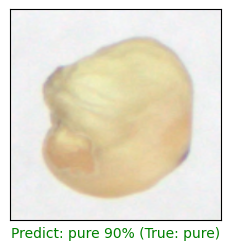

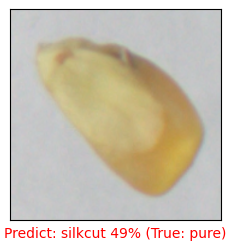

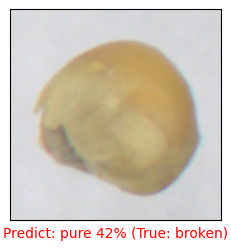

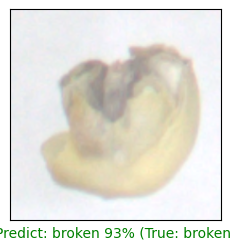

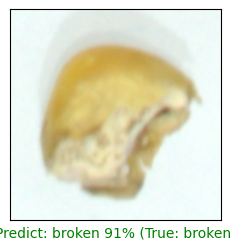

In [15]:
def plot_image(i, imgs, pred_labels, probs):
    true_label, img, pred_label, prob = imgs[i]['label'], imgs[i]['image'], pred_labels[i], probs[i]
    true_label = [label for label, idx in NAME2NUMBER.items() if idx == true_label][0]

    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    img = img.permute(1, 2, 0)
    plt.imshow(img, cmap=plt.cm.binary)

    color = ('green' if pred_label == true_label else 'red')
    plt.xlabel("Predict: {} {:2.0f}% (True: {})".format(pred_label,100*prob, true_label), color=color)

lst = np.random.randint(0, len(predictions[0][0]), 5)
print('Show images prediction')
for i in lst:
  plt.figure(figsize=(6,3))
  plt.subplot(1,2,1)
  plot_image(i, test_loader.dataset, labels, probs)
  plt.show()




/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


CLASSIFICATION REPORT 
               precision    recall  f1-score   support

      broken       0.67      0.62      0.65       920
  discolored       0.59      0.51      0.55       492
        pure       0.74      0.84      0.78      1194
     silkcut       0.61      0.52      0.56       259

    accuracy                           0.68      2865
   macro avg       0.65      0.62      0.63      2865
weighted avg       0.68      0.68      0.68      2865

--------------------------------------------------
CONFUSION MATRIX 



<Axes: >

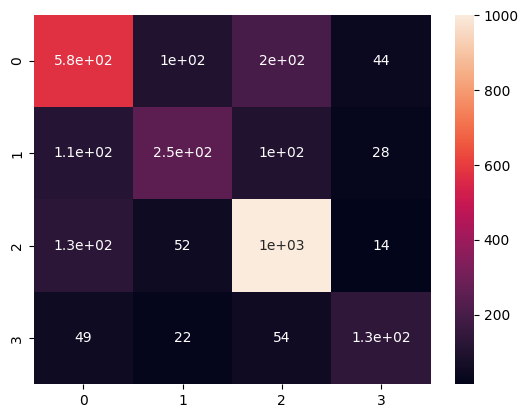

In [26]:
y_pred = get_label(np.concatenate([label.numpy() for label, pred in predictions]))

y_true = np.array([data['label'] for data in iter(test_loader.dataset)])
y_true = get_label(y_true)

print('CLASSIFICATION REPORT \n',classification_report(y_true, y_pred))
print(f'-'*50)
cm = confusion_matrix(y_true, y_pred)
print('CONFUSION MATRIX \n')
sns.heatmap(cm, annot=True)

## Pre-trained: ResNet 152

In [27]:
model_checkpoint = ModelCheckpoint(dirpath = 'checkpoint/',
                                   monitor='val_acc',
                                   verbose=True,
                                   mode='max',
                                   save_top_k=1)

early_stopping = EarlyStopping(monitor="val_acc", mode='max',
                               min_delta=1e-4, patience=5)

callbacks = [model_checkpoint, early_stopping]

backbone = torchvision.models.resnet152(weights="DEFAULT")
model1 = Model(backbone=backbone)

data_module = DataModule(
    batch_size=512,
    num_workers=1,
    train_path=train_path,
    val_path=val_path
)
trainer = L.Trainer(
    max_epochs=10,
    detect_anomaly=True,
    callbacks=callbacks,
)

trainer.fit(model, data_module)

Downloading: "https://download.pytorch.org/models/resnet152-f82ba261.pth" to /root/.cache/torch/hub/checkpoints/resnet152-f82ba261.pth
100%|██████████| 230M/230M [00:02<00:00, 105MB/s]
INFO: You have turned on `Trainer(detect_anomaly=True)`. This will significantly slow down compute speed and is recommended only for model debugging.
INFO:lightning.pytorch.utilities.rank_zero:You have turned on `Trainer(detect_anomaly=True)`. This will significantly slow down compute speed and is recommended only for model debugging.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available:

['/content/data/train/discolored/new_dc317_broken_000_bottom_213.png', '/content/data/train/discolored/new_dc354_broken_000_bottom_066.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_027.png', '/content/data/train/discolored/dc354_discolored_000_bottom_144.png', '/content/data/train/discolored/new_dc317_broken_002_top_109.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_029.png', '/content/data/train/discolored/dc354_broken_003_top_101.png', '/content/data/train/discolored/dc354_discolored_005_bottom_158.png', '/content/data/train/discolored/new_dc317_broken_001_top_211.png', '/content/data/train/discolored/new_dc354_broken_001_top_184.png', '/content/data/train/discolored/dc354_broken_004_bottom_103.png', '/content/data/train/discolored/new_dc354_discolored_002_top_079.png', '/content/data/train/discolored/dc354_discolored_005_top_150.png', '/content/data/train/discolored/dc354_broken_002_bottom_202.png', '/content/data/train/discolored/new_dc317_broken_

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (23) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 23: 'val_acc' reached 0.69991 (best 0.69991), saving model to '/content/checkpoint/epoch=0-step=23.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 23: 'val_acc' reached 0.69991 (best 0.69991), saving model to '/content/checkpoint/epoch=0-step=23.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 46: 'val_acc' reached 0.70595 (best 0.70595), saving model to '/content/checkpoint/epoch=1-step=46.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 46: 'val_acc' reached 0.70595 (best 0.70595), saving model to '/content/checkpoint/epoch=1-step=46.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 69: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 69: 'val_acc' was not in top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias p

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 92: 'val_acc' reached 0.70681 (best 0.70681), saving model to '/content/checkpoint/epoch=3-step=92.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 92: 'val_acc' reached 0.70681 (best 0.70681), saving model to '/content/checkpoint/epoch=3-step=92.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 115: 'val_acc' reached 0.70796 (best 0.70796), saving model to '/content/checkpoint/epoch=4-step=115.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 115: 'val_acc' reached 0.70796 (best 0.70796), saving model to '/content/checkpoint/epoch=4-step=115.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transfo

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 138: 'val_acc' reached 0.70911 (best 0.70911), saving model to '/content/checkpoint/epoch=5-step=138.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 138: 'val_acc' reached 0.70911 (best 0.70911), saving model to '/content/checkpoint/epoch=5-step=138.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transfo

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 161: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 161: 'val_acc' was not in top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 184: 'val_acc' reached 0.71342 (best 0.71342), saving model to '/content/checkpoint/epoch=7-step=184.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 184: 'val_acc' reached 0.71342 (best 0.71342), saving model to '/content/checkpoint/epoch=7-step=184.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transfo

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 207: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 207: 'val_acc' was not in top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 230: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 230: 'val_acc' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [28]:
predictions = trainer.predict(model1, test_loader)
preds, probs = predictions[0]
labels = get_label(preds)
preds[:5], probs[:5], labels[:5]

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


['/content/data/train/discolored/new_dc317_broken_000_bottom_213.png', '/content/data/train/discolored/new_dc354_broken_000_bottom_066.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_027.png', '/content/data/train/discolored/dc354_discolored_000_bottom_144.png', '/content/data/train/discolored/new_dc317_broken_002_top_109.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_029.png', '/content/data/train/discolored/dc354_broken_003_top_101.png', '/content/data/train/discolored/dc354_discolored_005_bottom_158.png', '/content/data/train/discolored/new_dc317_broken_001_top_211.png', '/content/data/train/discolored/new_dc354_broken_001_top_184.png', '/content/data/train/discolored/dc354_broken_004_bottom_103.png', '/content/data/train/discolored/new_dc354_discolored_002_top_079.png', '/content/data/train/discolored/dc354_discolored_005_top_150.png', '/content/data/train/discolored/dc354_broken_002_bottom_202.png', '/content/data/train/discolored/new_dc317_broken_

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Predicting: |          | 0/? [00:00<?, ?it/s]

(tensor([2, 0, 2, 2, 0]),
 tensor([0.2783, 0.2715, 0.3017, 0.2737, 0.2768]),
 ['pure', 'discolored', 'pure', 'pure', 'discolored'])

Show images prediction


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


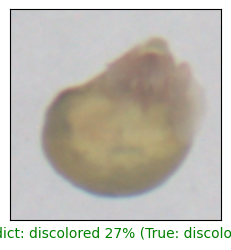

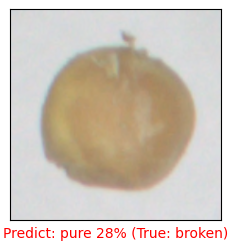

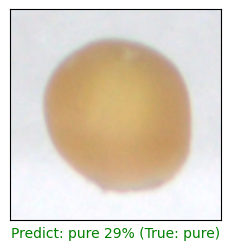

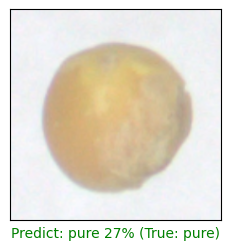

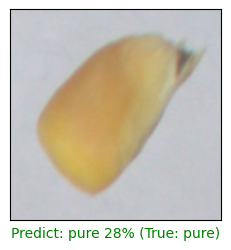

In [29]:
lst = np.random.randint(0, len(predictions[0][0]), 5)
print('Show images prediction')
for i in lst:
  plt.figure(figsize=(6,3))
  plt.subplot(1,2,1)
  plot_image(i, test_loader.dataset, labels, probs)
  plt.show()

CLASSIFICATION REPORT 
               precision    recall  f1-score   support

      broken       0.46      0.20      0.28       920
  discolored       0.24      0.24      0.24       492
        pure       0.48      0.66      0.56      1194
     silkcut       0.09      0.12      0.10       259

    accuracy                           0.39      2865
   macro avg       0.32      0.30      0.29      2865
weighted avg       0.40      0.39      0.37      2865

--------------------------------------------------
CONFUSION MATRIX 



<Axes: >

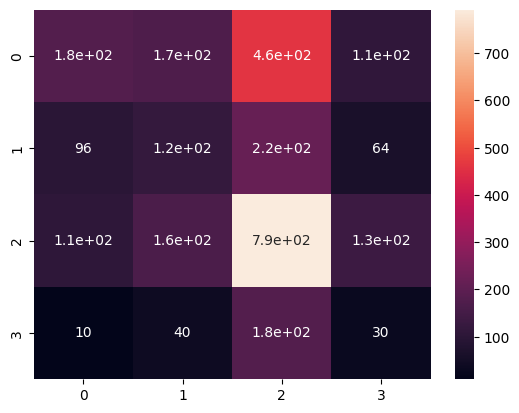

In [31]:
y_pred = get_label(np.concatenate([label.numpy() for label, pred in predictions]))

print('CLASSIFICATION REPORT \n',classification_report(y_true, y_pred))
print(f'-'*50)
cm = confusion_matrix(y_true, y_pred)
print('CONFUSION MATRIX \n')
sns.heatmap(cm, annot=True)

## Pre-trained: ResNet 152 with not pre-trained

In [32]:
model_checkpoint = ModelCheckpoint(dirpath = 'checkpoint/',
                                   monitor='val_acc',
                                   verbose=True,
                                   mode='max',
                                   save_top_k=1)

early_stopping = EarlyStopping(monitor="val_acc", mode='max',
                               min_delta=1e-4, patience=5)

callbacks = [model_checkpoint, early_stopping]

backbone = torchvision.models.resnet152(pretrained=False)
model2 = Model(backbone=backbone)

data_module = DataModule(
    batch_size=512,
    num_workers=1,
    train_path=train_path,
    val_path=val_path
)
trainer = L.Trainer(
    max_epochs=10,
    detect_anomaly=True,
    callbacks=callbacks,
)

trainer.fit(model, data_module)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
INFO: You have turned on `Trainer(detect_anomaly=True)`. This will significantly slow down compute speed and is recommended only for model debugging.
INFO:lightning.pytorch.utilities.rank_zero:You have turned on `Trainer(detect_anomaly=True)`. This will significantly slow down compute speed and is recommended only for model debugging.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False,

['/content/data/train/discolored/new_dc317_broken_000_bottom_213.png', '/content/data/train/discolored/new_dc354_broken_000_bottom_066.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_027.png', '/content/data/train/discolored/dc354_discolored_000_bottom_144.png', '/content/data/train/discolored/new_dc317_broken_002_top_109.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_029.png', '/content/data/train/discolored/dc354_broken_003_top_101.png', '/content/data/train/discolored/dc354_discolored_005_bottom_158.png', '/content/data/train/discolored/new_dc317_broken_001_top_211.png', '/content/data/train/discolored/new_dc354_broken_001_top_184.png', '/content/data/train/discolored/dc354_broken_004_bottom_103.png', '/content/data/train/discolored/new_dc354_discolored_002_top_079.png', '/content/data/train/discolored/dc354_discolored_005_top_150.png', '/content/data/train/discolored/dc354_broken_002_bottom_202.png', '/content/data/train/discolored/new_dc317_broken_

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Training: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 23: 'val_acc' reached 0.71544 (best 0.71544), saving model to '/content/checkpoint/epoch=0-step=23.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 23: 'val_acc' reached 0.71544 (best 0.71544), saving model to '/content/checkpoint/epoch=0-step=23.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 46: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 46: 'val_acc' was not in top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias p

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 69: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 69: 'val_acc' was not in top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias p

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 92: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 92: 'val_acc' was not in top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias p

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 115: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 115: 'val_acc' was not in top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 138: 'val_acc' reached 0.71831 (best 0.71831), saving model to '/content/checkpoint/epoch=5-step=138.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 138: 'val_acc' reached 0.71831 (best 0.71831), saving model to '/content/checkpoint/epoch=5-step=138.ckpt' as top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transfo

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 161: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 161: 'val_acc' was not in top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 184: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 184: 'val_acc' was not in top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 207: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 207: 'val_acc' was not in top 1
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 230: 'val_acc' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 230: 'val_acc' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [33]:
predictions = trainer.predict(model2, test_loader)
preds, probs = predictions[0]
labels = get_label(preds)
preds[:5], probs[:5], labels[:5]

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


['/content/data/train/discolored/new_dc317_broken_000_bottom_213.png', '/content/data/train/discolored/new_dc354_broken_000_bottom_066.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_027.png', '/content/data/train/discolored/dc354_discolored_000_bottom_144.png', '/content/data/train/discolored/new_dc317_broken_002_top_109.png', '/content/data/train/discolored/new_dc317_silkcut_000_top_029.png', '/content/data/train/discolored/dc354_broken_003_top_101.png', '/content/data/train/discolored/dc354_discolored_005_bottom_158.png', '/content/data/train/discolored/new_dc317_broken_001_top_211.png', '/content/data/train/discolored/new_dc354_broken_001_top_184.png', '/content/data/train/discolored/dc354_broken_004_bottom_103.png', '/content/data/train/discolored/new_dc354_discolored_002_top_079.png', '/content/data/train/discolored/dc354_discolored_005_top_150.png', '/content/data/train/discolored/dc354_broken_002_bottom_202.png', '/content/data/train/discolored/new_dc317_broken_

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Predicting: |          | 0/? [00:00<?, ?it/s]

(tensor([2, 2, 2, 2, 2]),
 tensor([1., 1., 1., 1., 1.]),
 ['pure', 'pure', 'pure', 'pure', 'pure'])

Show images prediction


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


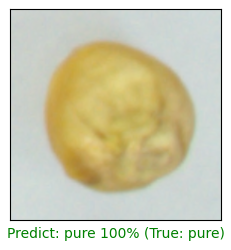

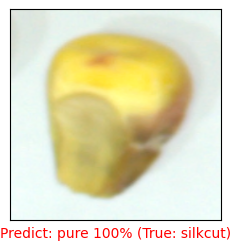

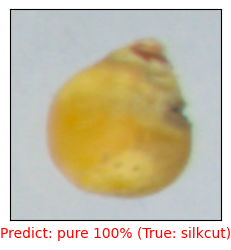

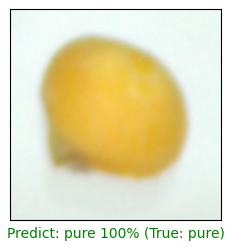

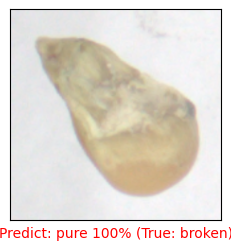

In [34]:
lst = np.random.randint(0, len(predictions[0][0]), 5)
print('Show images prediction')
for i in lst:
  plt.figure(figsize=(6,3))
  plt.subplot(1,2,1)
  plot_image(i, test_loader.dataset, labels, probs)
  plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


CLASSIFICATION REPORT 
               precision    recall  f1-score   support

      broken       0.00      0.00      0.00       920
  discolored       0.00      0.00      0.00       492
        pure       0.42      1.00      0.59      1194
     silkcut       0.00      0.00      0.00       259

    accuracy                           0.42      2865
   macro avg       0.10      0.25      0.15      2865
weighted avg       0.17      0.42      0.25      2865

--------------------------------------------------
CONFUSION MATRIX 



<Axes: >

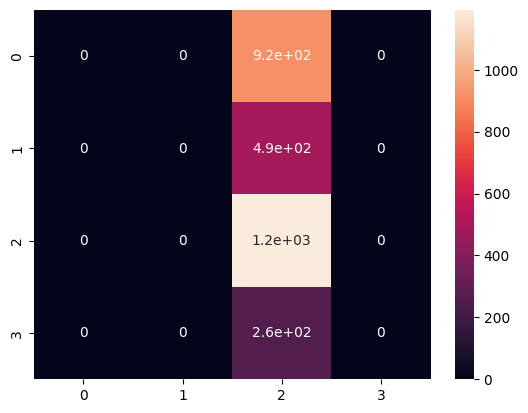

In [36]:
y_pred = get_label(np.concatenate([label.numpy() for label, pred in predictions]))

print('CLASSIFICATION REPORT \n',classification_report(y_true, y_pred))
print(f'-'*50)
cm = confusion_matrix(y_true, y_pred)
print('CONFUSION MATRIX \n')
sns.heatmap(cm, annot=True)